# Sub-clustering: Scientific Plots & Charts (K-Means Approach)

HDBSCAN gave either too many (39) or too few (3) clusters due to uneven density.
We switch to **K-Means on PCA features** with silhouette analysis to find the optimal number of sub-clusters.
Each sub-cluster is visualized with 15 random sample images.

In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import umap
import plotly.express as px


C:\Users\rohit rawat\Desktop\iitr_internship\image_classification\.venv\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
print("Loading dataset...")
df = pd.read_csv("../outputs/labelled_dataset.csv")
features = np.load("../embeddings/dino_features.npy")

cluster0_indices = df.index[df['cluster_id'] == 0].tolist()
sub_df = df.iloc[cluster0_indices].copy().reset_index(drop=True)
sub_features = features[cluster0_indices]

print(f"Isolated {len(sub_df)} images for sub-clustering.")
print(f"Feature matrix shape: {sub_features.shape}")


Loading dataset...
Isolated 26397 images for sub-clustering.
Feature matrix shape: (26397, 384)


In [3]:
print("Applying PCA (reduce to 150 dims)...")
pca = PCA(n_components=150, random_state=42)
pca_features = pca.fit_transform(sub_features)
print(f"Explained variance: {np.sum(pca.explained_variance_ratio_):.4f}")


Applying PCA (reduce to 150 dims)...
Explained variance: 0.9249


In [4]:
# Silhouette analysis to find optimal k
print("Running silhouette analysis for k=5 to k=20...")
k_range = range(5, 21)
silhouette_scores = []
inertias = []

for k in k_range:
    km = KMeans(n_clusters=k, random_state=42, n_init=10, max_iter=300)
    labels = km.fit_predict(pca_features)
    score = silhouette_score(pca_features, labels, sample_size=5000, random_state=42)
    silhouette_scores.append(score)
    inertias.append(km.inertia_)
    print(f"  k={k:2d}  silhouette={score:.4f}  inertia={km.inertia_:.0f}")

best_k = list(k_range)[np.argmax(silhouette_scores)]
print(f"\nBest k by silhouette: {best_k}")


Running silhouette analysis for k=5 to k=20...


  k= 5  silhouette=0.0346  inertia=18022586


  k= 6  silhouette=0.0361  inertia=17624760


  k= 7  silhouette=0.0372  inertia=17356912


  k= 8  silhouette=0.0360  inertia=17123814


  k= 9  silhouette=0.0355  inertia=16913736


  k=10  silhouette=0.0373  inertia=16725856


  k=11  silhouette=0.0345  inertia=16547821


  k=12  silhouette=0.0382  inertia=16375636


  k=13  silhouette=0.0298  inertia=16214516


  k=14  silhouette=0.0275  inertia=16064357


  k=15  silhouette=0.0284  inertia=15944885


  k=16  silhouette=0.0289  inertia=15830546


  k=17  silhouette=0.0263  inertia=15723648


  k=18  silhouette=0.0289  inertia=15609283


  k=19  silhouette=0.0281  inertia=15511226


  k=20  silhouette=0.0275  inertia=15427265

Best k by silhouette: 12


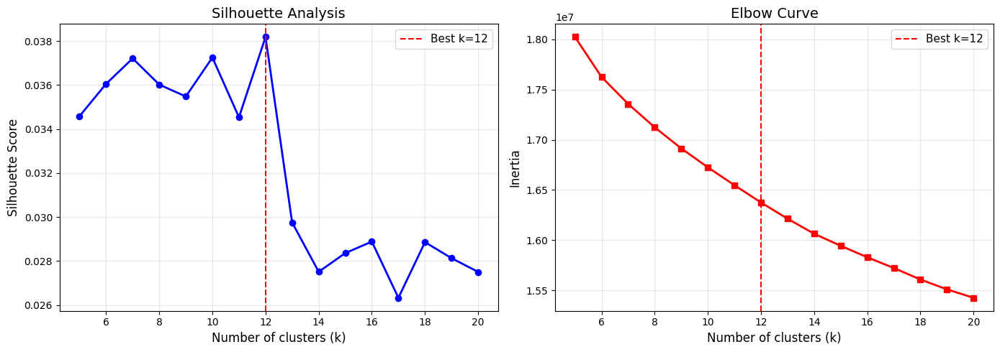

In [5]:
# Plot silhouette scores and elbow curve
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

ax1.plot(list(k_range), silhouette_scores, 'bo-', linewidth=2)
ax1.axvline(x=best_k, color='r', linestyle='--', label=f'Best k={best_k}')
ax1.set_xlabel('Number of clusters (k)', fontsize=12)
ax1.set_ylabel('Silhouette Score', fontsize=12)
ax1.set_title('Silhouette Analysis', fontsize=14)
ax1.legend(fontsize=11)
ax1.grid(True, alpha=0.3)

ax2.plot(list(k_range), inertias, 'rs-', linewidth=2)
ax2.axvline(x=best_k, color='r', linestyle='--', label=f'Best k={best_k}')
ax2.set_xlabel('Number of clusters (k)', fontsize=12)
ax2.set_ylabel('Inertia', fontsize=12)
ax2.set_title('Elbow Curve', fontsize=14)
ax2.legend(fontsize=11)
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('../outputs/cluster0_silhouette_elbow.png', dpi=150, bbox_inches='tight')
plt.show()


In [6]:
# Final clustering with best k
print(f"Running final K-Means with k={best_k}...")
km_final = KMeans(n_clusters=best_k, random_state=42, n_init=20, max_iter=500)
sub_clusters = km_final.fit_predict(pca_features)

sub_df['sub_cluster'] = sub_clusters
print(f"\nSub-cluster distribution:")
display(sub_df['sub_cluster'].value_counts().sort_index().to_frame())


Running final K-Means with k=12...



Sub-cluster distribution:


,count
sub_cluster,
0,2114
1,5353
2,1914
3,1225
4,1328
5,3326
6,2732
7,971
8,3525


In [7]:
output_path = "../outputs/cluster0_subclusters.csv"
sub_df.to_csv(output_path, index=False)
print(f"Saved sub-cluster assignments to {output_path}")


Saved sub-cluster assignments to ../outputs/cluster0_subclusters.csv


In [8]:
# UMAP for visualization only
print("Computing UMAP for visualization...")
umap_model = umap.UMAP(n_components=2, n_neighbors=30, min_dist=0.05, metric='cosine', random_state=42)
umap_embeddings = umap_model.fit_transform(pca_features)

fig = px.scatter(
    x=umap_embeddings[:, 0],
    y=umap_embeddings[:, 1],
    color=sub_clusters.astype(str),
    title=f"K-Means Sub-clustering (k={best_k}) of Scientific Plots & Charts",
    color_discrete_sequence=px.colors.qualitative.Alphabet
)
fig.update_layout(width=1000, height=800)
fig.write_image("../outputs/cluster0_umap.png", scale=2)
fig.show()


Computing UMAP for visualization...


C:\Users\rohit rawat\Desktop\iitr_internship\image_classification\.venv\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


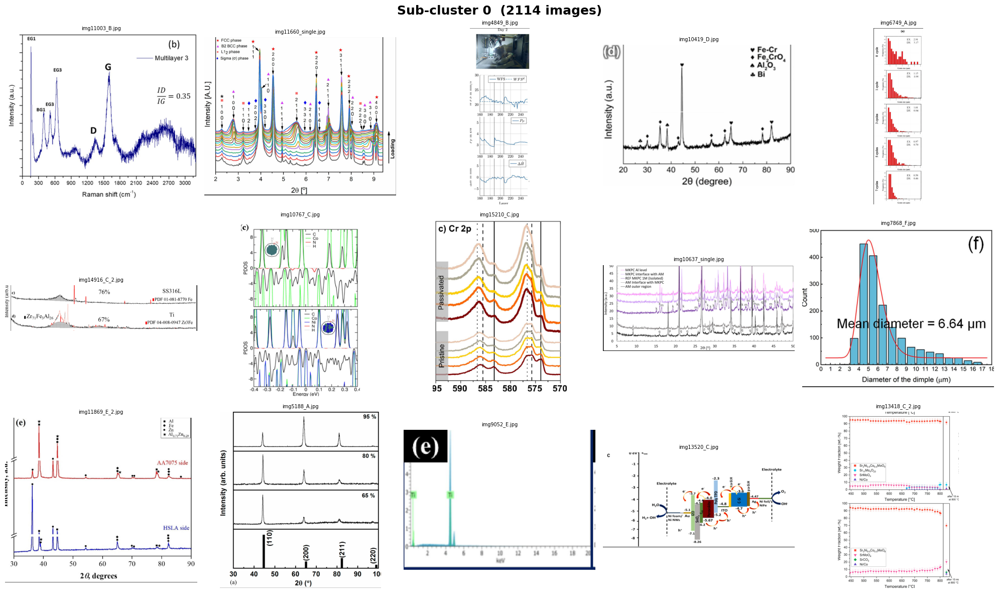

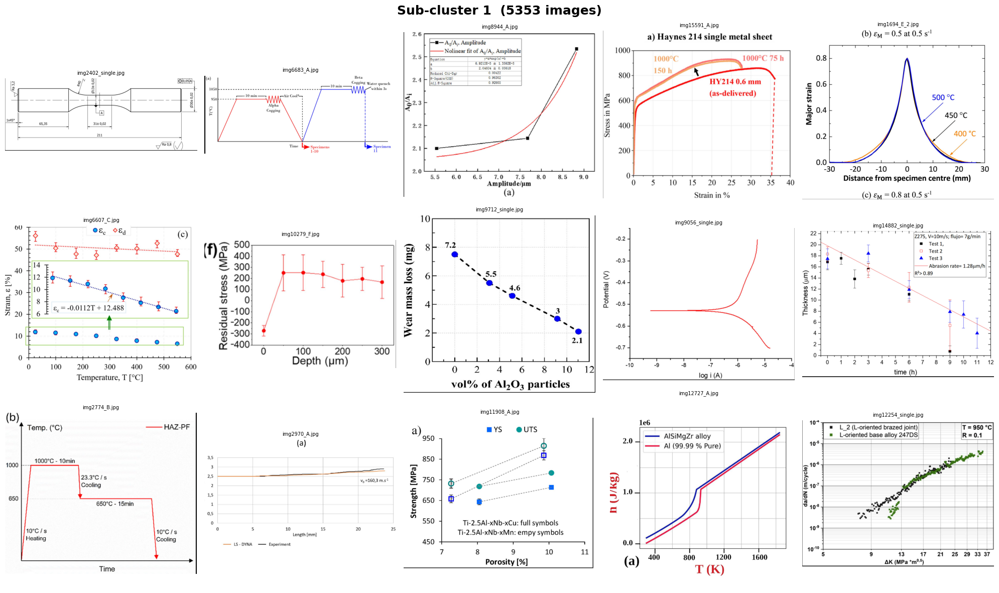

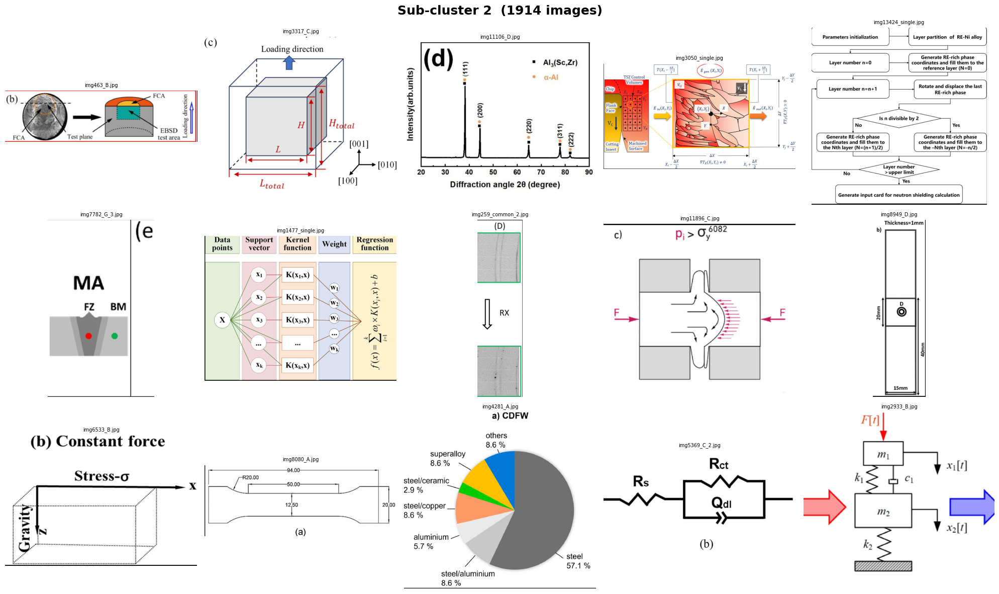

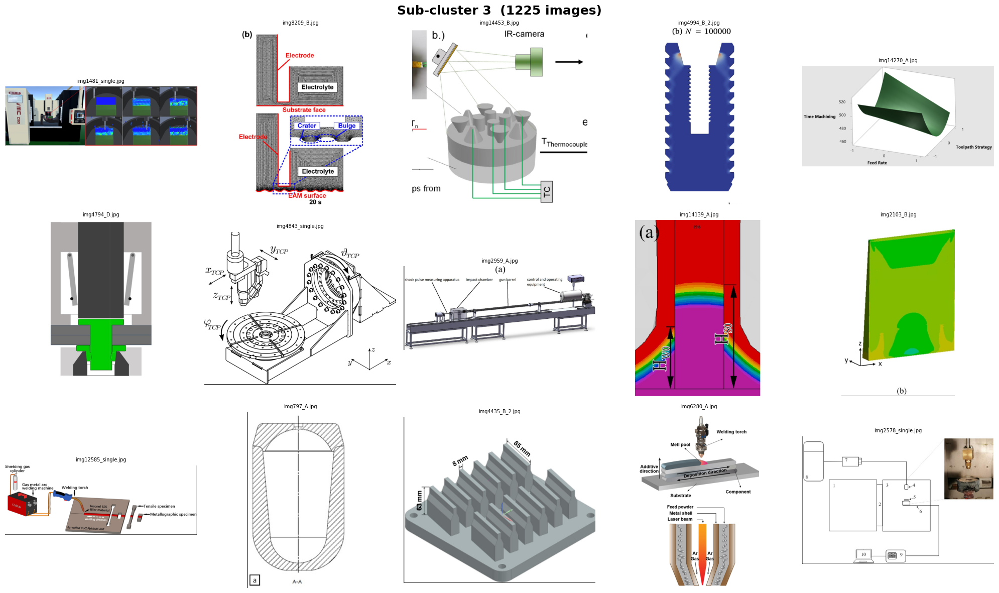

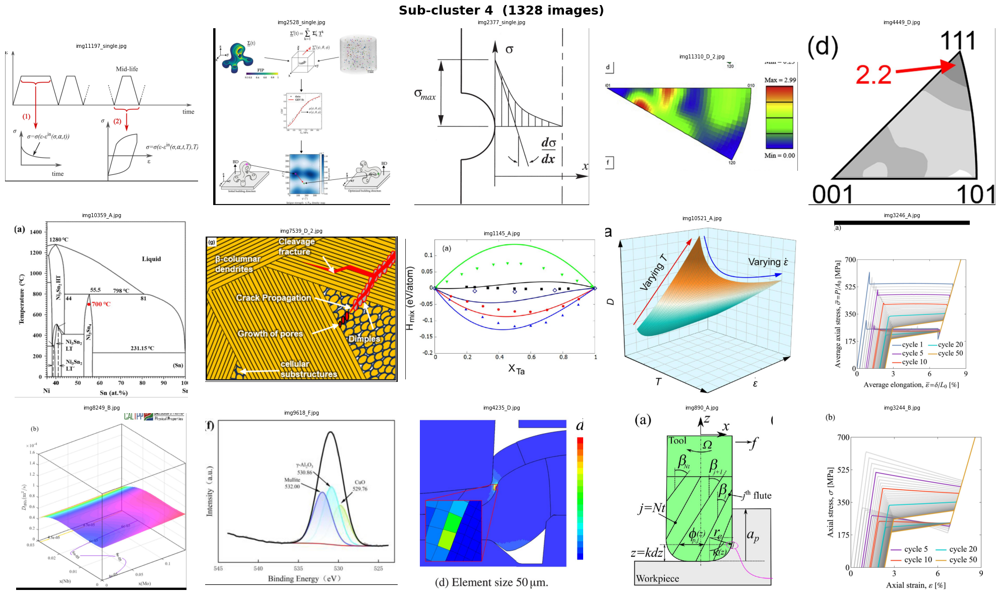

...

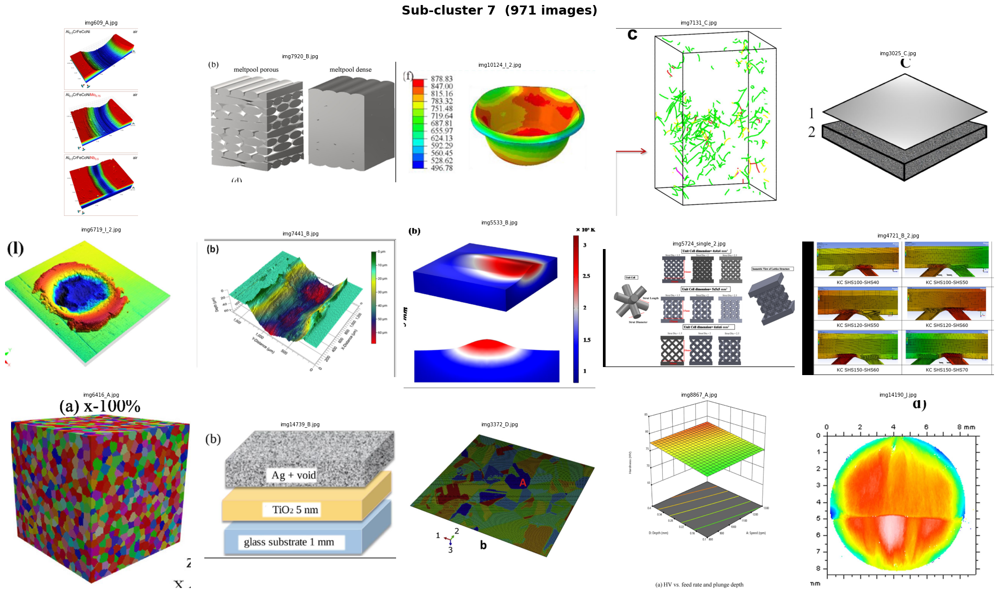

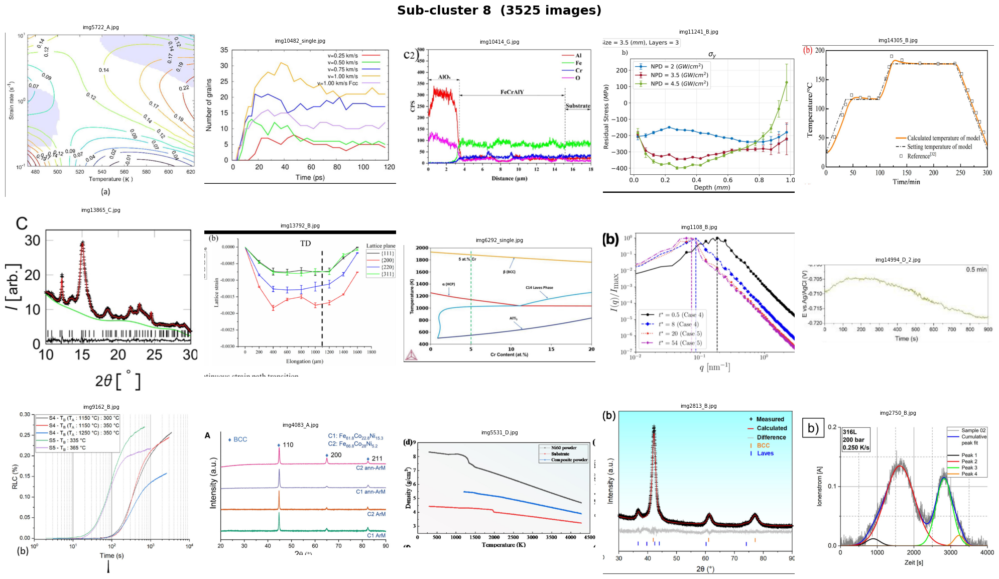

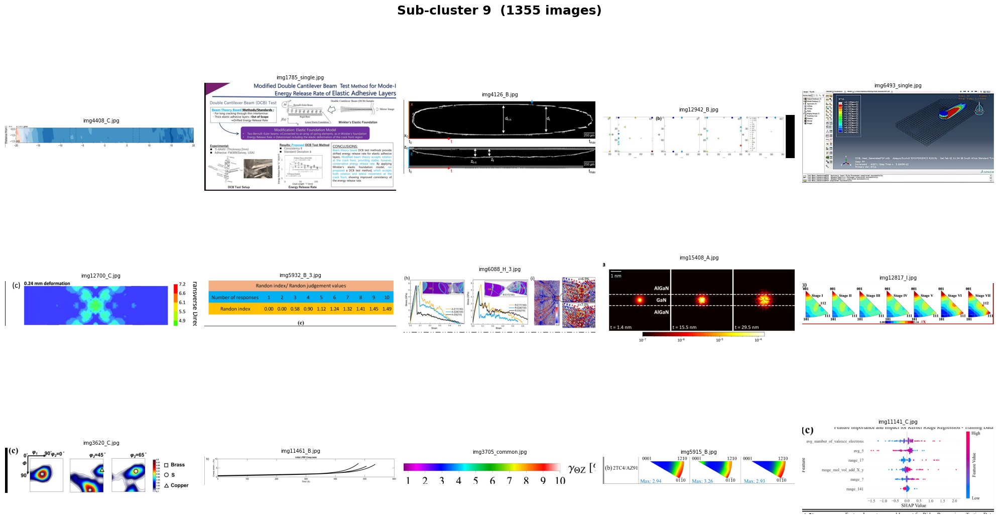

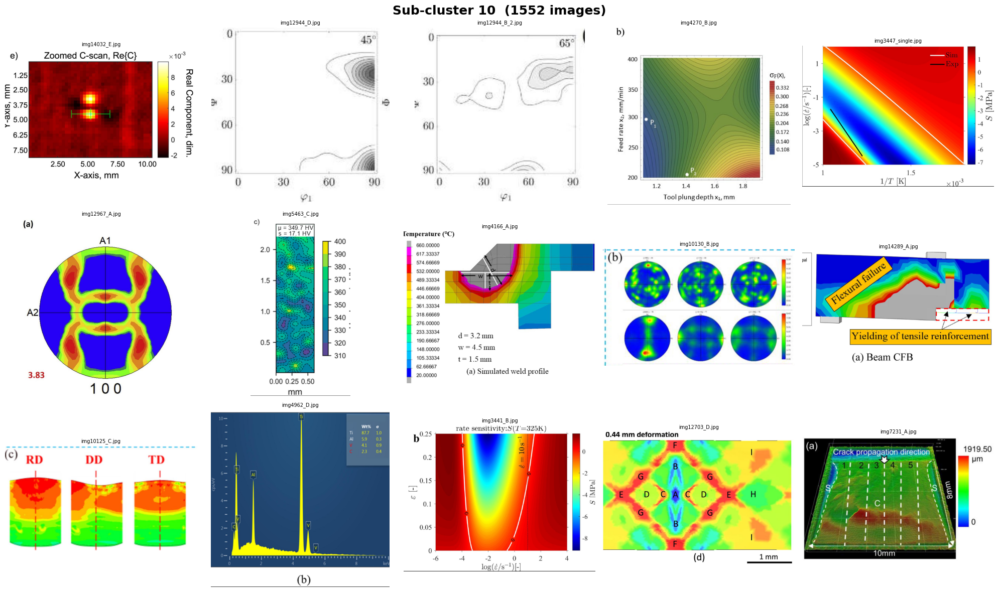

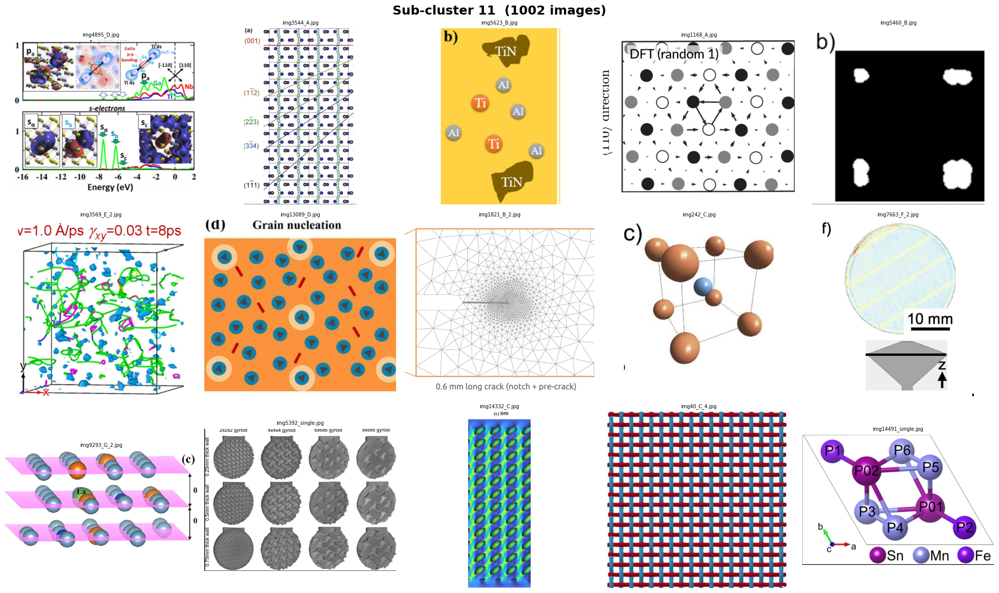

In [9]:
# Show 15 random sample images per sub-cluster
for cluster_id in sorted(sub_df['sub_cluster'].unique()):
    cluster_images = sub_df[sub_df['sub_cluster'] == cluster_id]
    n_samples = min(15, len(cluster_images))
    samples = cluster_images.sample(n=n_samples, random_state=42)

    fig, axes = plt.subplots(3, 5, figsize=(20, 12))
    fig.suptitle(f"Sub-cluster {cluster_id}  ({len(cluster_images)} images)", fontsize=18, fontweight='bold')
    axes = axes.flatten()

    for idx, (_, row) in enumerate(samples.iterrows()):
        img_path = row['image_path']
        if not os.path.exists(img_path):
            img_path = os.path.join("..", img_path)

        try:
            img = Image.open(img_path)
            axes[idx].imshow(img)
            axes[idx].set_title(os.path.basename(row['image_path']), fontsize=7)
        except Exception as e:
            axes[idx].set_title(f"Error", fontsize=8)
        axes[idx].axis("off")

    for i in range(n_samples, len(axes)):
        axes[i].axis("off")

    plt.tight_layout()
    plt.show()
